In [1]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from lmfit.models import LorentzianModel
from renishawWiRE import WDFReader

In [2]:
try:
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg

    plot = True
except ImportError:
    plot = False

# 633

### Import data

In [3]:
url1 = r"F:\Postdoc Montpellier 2022\Data\Raman\Nam\20230823_F1048_FeCl_1_3\633/"
url2 = r"F1048_633_lineMapping1.wdf"
filename = url1 + url2
reader = WDFReader(filename)
print(reader)
reader.print_info()

 # For mapping, xdata is still wavenumber
wn = reader.xdata
spectra = reader.spectra
print(len(wn))
print(len(spectra))
print(wn.shape, spectra.shape)

                   Title:	633 line mapping
             WiRE version:	4.2.0.5037
        Laser Wavelength:	632.799258586681 nm
                   Count:	201
                Capacity:	201
      Point Per Spectrum:	1015
               Scan Type:	StepRepeat
        Measurement Type:	Mapping
           Spectral Unit:	counts
              Xlist Unit:	1/cm
            Xlist Length:	1015
              Ylist Unit:	px
            Ylist Length:	1
               Xpos Unit:	um
               Ypos Unit:	um
1015
201
(1015,) (201, 1015)


### Define function

In [4]:
def peak_in_range(spectra, wn, range, method="max", **params):
    """Find the max intensity of peak within range
    method can be max, min, or mean
    """
    cond = np.where((wn >= range[0]) & (wn <= range[1]))[0]
    spectra_cut = spectra[:, :, cond]
    return getattr(np, method)(spectra_cut, axis=2, **params)

https://lmfit.github.io/lmfit-py/builtin_models.html

In [5]:
plt.rcParams.update({'figure.max_open_warning': 0})

### Overview all spectra G mode

201
The size of mapping is 201 * 1
(1015,) (201, 1015)


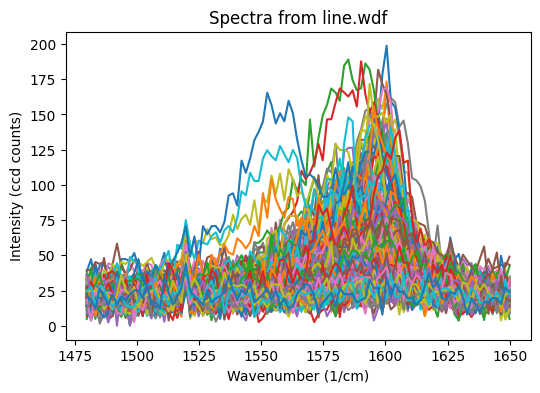

In [6]:
def main():
    url1 = r"F:\Postdoc Montpellier 2022\Data\Raman\Nam\20230823_F1048_FeCl_1_3\633/"
    url2 = r"F1048_633_lineMapping1.wdf"
    filename = url1 + url2
    reader = WDFReader(filename)

    # For mapping, xdata is still wavenumber
    wn = reader.xdata
    spectra = reader.spectra
    print(len(spectra))
    x = reader.xpos
    y = reader.ypos
    w, h = reader.map_shape
    print("The size of mapping is {0:d} * {1:d}".format(w, h))
    assert wn.shape[0] == spectra.shape[1]
    # Now spectra.shape becomes (i, j, spectrum)
    print(wn.shape, spectra.shape)
    if plot is True:        
        # Level the spectra with baseline intensity
        spectra = spectra - spectra.min(axis=1, keepdims=True)

        # Need to revert matrix for plotting
        spectra = spectra.T
        plt.figure(figsize=(6, 4))
        # plot the first 5 spectra
        for i in range(spectra.shape[1]):#spectra.shape[1]
            start = 0 # first point of spectra for fitting
            stop = 100# last point of spectra for fitting
            plt.plot(wn[start:stop], spectra[:, i][start:stop], label="{0:d}".format(i))
        #plt.legend()
        plt.xlabel("Wavenumber (1/cm)")
        plt.ylabel("Intensity (ccd counts)")
        plt.title("Spectra from line.wdf")
        #plt.ylim(0, 500)
        #plt.xlim(, 350)
        plt.show(block=False)
        plt.pause(3)
        plt.tight_layout()
        plt.close()        
    else:
        print("Wavenumber is like:", wn)
        print("Spectra matrix is like: \n", spectra)

    return

if __name__ == "__main__":
    main()

Full fitting

201
The size of mapping is 201 * 1
(1015,) (201, 1015)
Current index i= 0
Current index i= 1
Current index i= 2
Current index i= 3
Current index i= 4
Current index i= 5
Current index i= 6
Current index i= 7
Current index i= 8
Current index i= 9
Current index i= 10
Current index i= 11
Current index i= 12
Current index i= 13
Current index i= 14
Current index i= 15
Current index i= 16
Current index i= 17
Current index i= 18
Current index i= 19
Current index i= 20
Current index i= 21
Current index i= 22
Current index i= 23
Current index i= 24
Current index i= 25
Current index i= 26
Current index i= 27
Current index i= 28
Current index i= 29
Current index i= 30
Current index i= 31
Current index i= 32
Current index i= 33
Current index i= 34
Current index i= 35
Current index i= 36
Current index i= 37
Current index i= 38
Current index i= 39
Current index i= 40
Current index i= 41
Current index i= 42
Current index i= 43
Current index i= 44
Current index i= 45
Current index i= 46
Current index i

,l1_amplitude,l1_center,l1_sigma,l1_fwhm,l1_height,l2_amplitude,l2_center,l2_sigma,l2_fwhm,l2_height
0,10.000000,1580.123820,2.355008e+81,4.710016e+81,1.351630e-81,10.000000,1589.970867,2.355314e+81,4.710628e+81,1.351454e-81
0,10.010848,1581.574011,7.640785e+01,1.528157e+02,4.170451e-02,1643.228701,1582.169819,1.416891e+02,2.833782e+02,3.691576e+00
0,27.207253,1591.054908,3.000014e+00,6.000027e+00,2.886766e+00,10.000000,1588.163287,5.415250e+01,1.083050e+02,5.878028e-02
0,10.000000,1588.673822,1.263939e+01,2.527877e+01,2.518397e-01,10.000000,1560.651928,1.104883e+01,2.209766e+01,2.880938e-01
0,10.000000,1589.714659,2.400880e+01,4.801759e+01,1.325805e-01,10.000000,1565.375250,4.979510e+00,9.959021e+00,6.392394e-01
...,...,...,...,...,...,...,...,...,...,...
0,1351.510523,1597.601654,3.200865e+01,6.401729e+01,1.344009e+01,10.001883,1560.134463,1.677112e+01,3.354224e+01,1.898322e-01
0,103.304158,1589.799973,3.000000e+00,6.000000e+00,1.096091e+01,36.616334,1556.910757,3.000000e+00,6.000000e+00,3.885114e+00
0,55.687529,1605.422017,3.000000e+00,6.000000e+00,5.908631e+00,11391.523773,1540.000000,6.044658e+02,1.208932e+03,5.998742e+00
0,56.812556,1591.610089,3.000000e+00,6.000000e+00,6.028000e+00,8875.864715,1540.123364,8.459005e+02,1.691801e+03,3.339962e+00


<Figure size 600x400 with 0 Axes>

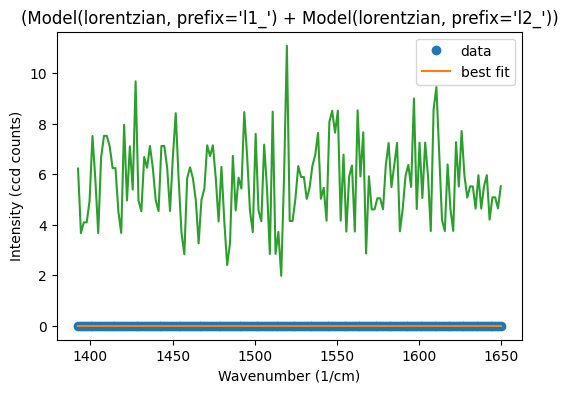

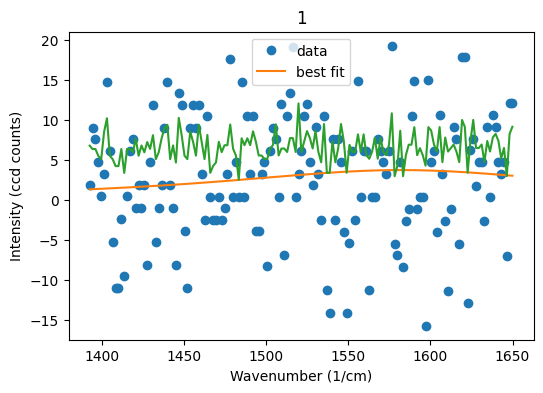

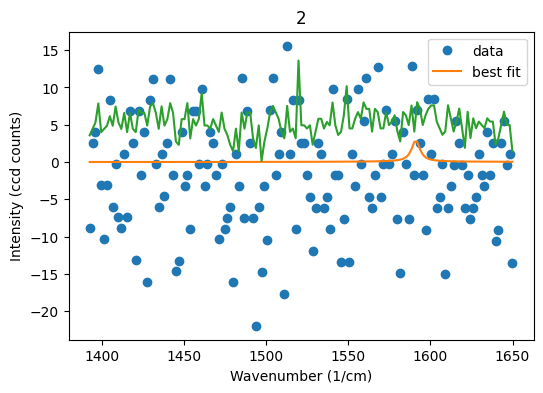

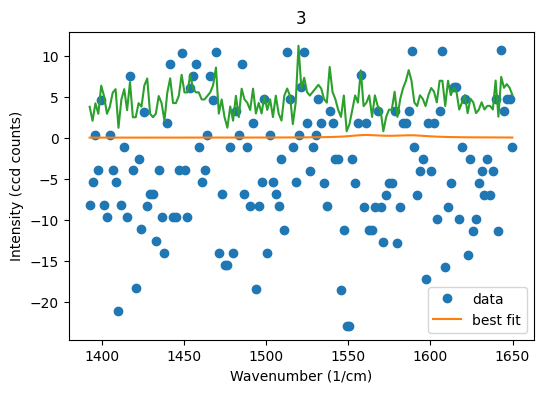

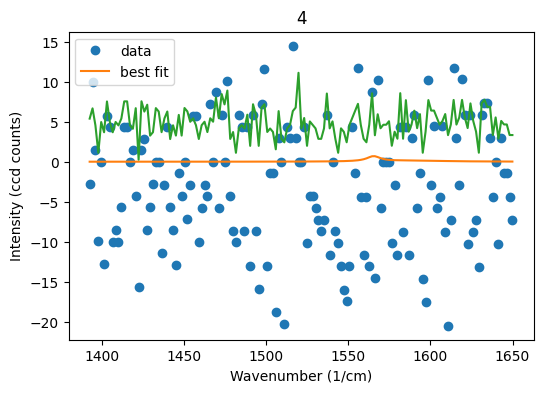

...

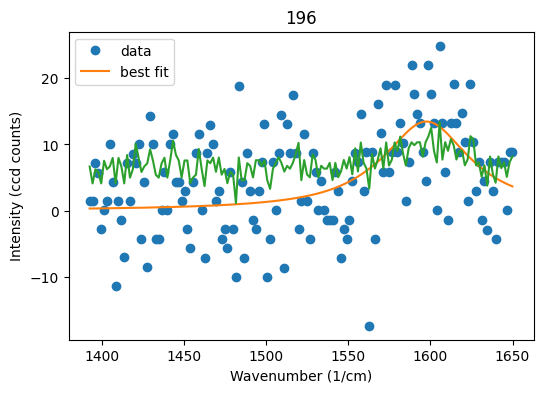

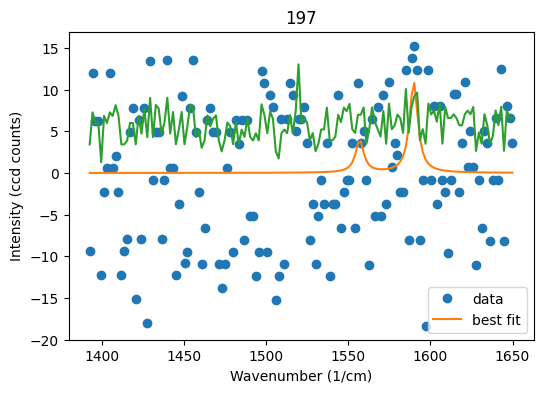

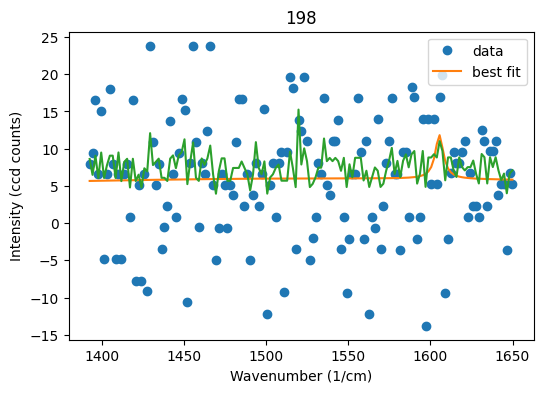

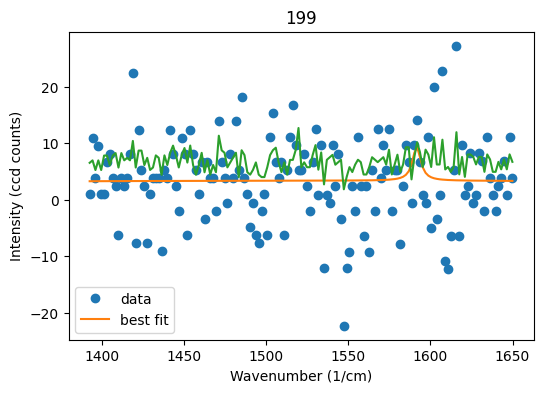

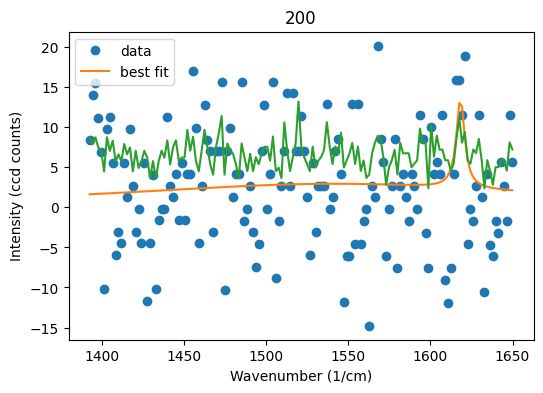

In [7]:
url1 = r"F:\Postdoc Montpellier 2022\Data\Raman\Nam\20230823_F1048_FeCl_1_3\633/"
url2 = r"F1048_633_lineMapping1.wdf"
filename = url1 + url2

reader = WDFReader(filename)

# For mapping, xdata is still wavenumber
wn = reader.xdata
spectra = reader.spectra
print(len(spectra))
x = reader.xpos
y = reader.ypos
w, h = reader.map_shape
df = pd.DataFrame([])
print("The size of mapping is {0:d} * {1:d}".format(w, h))
assert wn.shape[0] == spectra.shape[1]
# Now spectra.shape becomes (i, j, spectrum)
print(wn.shape, spectra.shape)

if plot is True:
    # Level the spectra with baseline intensity
    spectra = spectra - spectra.min(axis=1, keepdims=True)

    # Need to revert matrix for plotting
    spectra = spectra.T
    plt.figure(figsize=(6, 4))
    # plot the first 5 spectra
    for i in range(spectra.shape[1]): #spectra.shape[1]
        print("Current index i=",i) 
        start = 0 # first point of spectra for fitting
        stop = 150# last point of spectra for fitting

        Lorentzian1 = LorentzianModel(prefix='l1_')
        pars = Lorentzian1.guess((spectra[:, i][start:stop]-spectra[:, 0][start:stop]), x=wn[:][start:stop])
        pars['l1_center'].set(1590, min=1580, max=1630)
        pars['l1_sigma'].set(15, min=3)
        pars['l1_amplitude'].set(2000, min=10)
        
        Lorentzian2 = LorentzianModel(prefix='l2_')
        pars.update(Lorentzian2.make_params())
        pars['l2_center'].set(1560, min=1540, max=1590)
        pars['l2_sigma'].set(15, min=3)
        pars['l2_amplitude'].set(2000, min=10)
        
        
        mod = Lorentzian1 + Lorentzian2 
        
        init = mod.eval(pars, x=wn[:][start:stop])
        

        #pars = mod.guess((spectra[:, i][start:stop]-spectra[:, 0][start:stop]), x=wn[:][start:stop])
        out = mod.fit((spectra[:, i][start:stop]-spectra[:, 0][start:stop]), pars, x=wn[:][start:stop])
        plt.figure(figsize=(6, 4)) 
        out.plot_fit(title= i)
        plt.xlabel("Wavenumber (1/cm)")
        plt.ylabel("Intensity (ccd counts)")
        #plt.legend()
        #print(out.fit_report(min_correl=0.25))
        #print(out.params.valuesdict())
        
            
        plt.plot(wn[:][start:stop], 0.3*spectra[:, i][start:stop], label="{0:d}".format(i))
        
        data = pd.DataFrame([out.params.valuesdict()], columns=out.params.valuesdict().keys())
        df = df.append(data)
        
    #plt.show(block=False)
    #plt.pause(3)
    #plt.tight_layout()
    #plt.clf()
    
else:
    print("Wavenumber is like:", wn)
    print("Spectra matrix is like: \n", spectra)
display(df)


In [8]:
df.head(5)

,l1_amplitude,l1_center,l1_sigma,l1_fwhm,l1_height,l2_amplitude,l2_center,l2_sigma,l2_fwhm,l2_height
0,10.000000,1580.123820,2.355008e+81,4.710016e+81,1.351630e-81,10.000000,1589.970867,2.355314e+81,4.710628e+81,1.351454e-81
0,10.010848,1581.574011,7.640785e+01,1.528157e+02,4.170451e-02,1643.228701,1582.169819,1.416891e+02,2.833782e+02,3.691576e+00
0,27.207253,1591.054908,3.000014e+00,6.000027e+00,2.886766e+00,10.000000,1588.163287,5.415250e+01,1.083050e+02,5.878028e-02
0,10.000000,1588.673822,1.263939e+01,2.527877e+01,2.518397e-01,10.000000,1560.651928,1.104883e+01,2.209766e+01,2.880938e-01
0,10.000000,1589.714659,2.400880e+01,4.801759e+01,1.325805e-01,10.000000,1565.375250,4.979510e+00,9.959021e+00,6.392394e-01


In [9]:
df.describe()

,l1_amplitude,l1_center,l1_sigma,l1_fwhm,l1_height,l2_amplitude,l2_center,l2_sigma,l2_fwhm,l2_height
count,201.000000,201.000000,2.010000e+02,2.010000e+02,2.010000e+02,2.010000e+02,201.000000,2.010000e+02,2.010000e+02,2.010000e+02
mean,1478.020881,1594.887326,1.171646e+79,2.343291e+79,3.960814e+01,1.869722e+04,1565.498035,1.171798e+79,2.343596e+79,1.679032e+01
std,1151.060078,6.533285,1.661094e+80,3.322189e+80,3.164451e+01,9.160700e+04,18.966903,1.661310e+80,3.322621e+80,2.257177e+01
min,10.000000,1580.000219,3.000000e+00,6.000000e+00,1.351630e-81,1.000000e+01,1540.000000,3.000000e+00,6.000000e+00,1.351454e-81
25%,624.657105,1591.407835,7.956915e+00,1.591383e+01,1.679985e+01,1.612254e+02,1540.004541,7.161684e+00,1.432337e+01,3.223063e+00
50%,1176.910807,1594.209312,1.218424e+01,2.436849e+01,2.845535e+01,1.664126e+03,1572.127064,2.619738e+01,5.239476e+01,7.584037e+00
75%,2186.423238,1597.314931,1.588930e+01,3.177859e+01,5.378550e+01,5.881829e+03,1579.552265,2.855081e+02,5.710163e+02,2.190454e+01
max,5847.449202,1629.967952,2.355008e+81,4.710016e+81,1.505287e+02,1.068492e+06,1590.000000,2.355314e+81,4.710628e+81,1.313307e+02


In [10]:
df = df.reset_index()
df = df.drop('index', axis=1)
df.head()

,l1_amplitude,l1_center,l1_sigma,l1_fwhm,l1_height,l2_amplitude,l2_center,l2_sigma,l2_fwhm,l2_height
0,10.000000,1580.123820,2.355008e+81,4.710016e+81,1.351630e-81,10.000000,1589.970867,2.355314e+81,4.710628e+81,1.351454e-81
1,10.010848,1581.574011,7.640785e+01,1.528157e+02,4.170451e-02,1643.228701,1582.169819,1.416891e+02,2.833782e+02,3.691576e+00
2,27.207253,1591.054908,3.000014e+00,6.000027e+00,2.886766e+00,10.000000,1588.163287,5.415250e+01,1.083050e+02,5.878028e-02
3,10.000000,1588.673822,1.263939e+01,2.527877e+01,2.518397e-01,10.000000,1560.651928,1.104883e+01,2.209766e+01,2.880938e-01
4,10.000000,1589.714659,2.400880e+01,4.801759e+01,1.325805e-01,10.000000,1565.375250,4.979510e+00,9.959021e+00,6.392394e-01


In [11]:
df["Spectra_Number"] = df.index
df.head(5)

,l1_amplitude,l1_center,l1_sigma,l1_fwhm,l1_height,l2_amplitude,l2_center,l2_sigma,l2_fwhm,l2_height,Spectra_Number
0,10.000000,1580.123820,2.355008e+81,4.710016e+81,1.351630e-81,10.000000,1589.970867,2.355314e+81,4.710628e+81,1.351454e-81,0
1,10.010848,1581.574011,7.640785e+01,1.528157e+02,4.170451e-02,1643.228701,1582.169819,1.416891e+02,2.833782e+02,3.691576e+00,1
2,27.207253,1591.054908,3.000014e+00,6.000027e+00,2.886766e+00,10.000000,1588.163287,5.415250e+01,1.083050e+02,5.878028e-02,2
3,10.000000,1588.673822,1.263939e+01,2.527877e+01,2.518397e-01,10.000000,1560.651928,1.104883e+01,2.209766e+01,2.880938e-01,3
4,10.000000,1589.714659,2.400880e+01,4.801759e+01,1.325805e-01,10.000000,1565.375250,4.979510e+00,9.959021e+00,6.392394e-01,4


In [12]:
df_height = pd.concat([df["l1_height"], df["l2_height"]])
df_center = pd.concat([df["l1_center"], df["l2_center"]])
df_fwhm = pd.concat([df["l1_fwhm"], df["l2_fwhm"]])

df_concat = pd.concat([df_height, df_center, df_fwhm], axis=1)
df_concat.columns = ['height', 'G_mode', 'fwhm']
df_concat["Spectra_Number"] = df["Spectra_Number"]

df_clean_G = df_concat
df_clean_G.head()

,height,G_mode,fwhm,Spectra_Number
0,1.351630e-81,1580.123820,4.710016e+81,0
1,4.170451e-02,1581.574011,1.528157e+02,1
2,2.886766e+00,1591.054908,6.000027e+00,2
3,2.518397e-01,1588.673822,2.527877e+01,3
4,1.325805e-01,1589.714659,4.801759e+01,4


In [13]:
df_clean_G.shape

(402, 4)

In [14]:
df_clean_G = df_clean_G.loc[((df_clean_G["height"] > 20) & (df_clean_G["height"] < 10000))]
df_clean_G = df_clean_G.loc[(df_clean_G["G_mode"] > 1550) & (df_clean_G["G_mode"] < 1620)]
df_clean_G = df_clean_G.loc[(df_clean_G["fwhm"] > 3) & (df_clean_G["fwhm"] < 100)]
df_clean_G.head(5)

,height,G_mode,fwhm,Spectra_Number
9,25.044618,1596.191418,25.063263,9
10,49.068534,1596.049198,21.963632,10
11,77.699208,1594.533002,20.113121,11
12,71.647103,1594.297784,9.898058,12
13,89.456894,1593.829328,18.501494,13


In [15]:
df_clean_G.describe()

,height,G_mode,fwhm,Spectra_Number
count,186.000000,186.000000,186.000000,186.000000
mean,51.757084,1589.800722,27.143707,90.252688
std,28.876948,9.823902,13.358328,49.564434
min,20.505041,1556.030969,6.000000,9.000000
25%,28.392142,1585.433767,17.517062,49.250000
50%,43.697826,1593.163994,25.547382,92.000000
75%,68.242280,1596.349532,34.105689,128.750000
max,150.528656,1604.286284,81.332031,192.000000


In [16]:
df_clean_G.to_csv(r"F:\Postdoc Montpellier 2022\Data\Raman\Nam\20230823_F1048_FeCl_1_3\633\fit_res_633_G.csv")
url = r"F:\Postdoc Montpellier 2022\Data\Raman\Nam\20230823_F1048_FeCl_1_3\633\fit_res_633_G.csv"
df_633_G = pd.read_csv(url, encoding='ISO-8859-1', delimiter=',').drop('Unnamed: 0', axis = 'columns')
df_633_G.tail(5)

,height,G_mode,fwhm,Spectra_Number
181,32.085715,1575.260244,18.234820,151
182,22.075237,1572.915765,23.126547,152
183,53.626673,1574.683731,12.294589,163
184,21.904540,1573.394431,18.244673,164
185,21.504452,1575.159445,6.000001,168


In [17]:
df_633_G.count()

height            186
G_mode            186
fwhm              186
Spectra_Number    186
dtype: int64

In [18]:
list_G = df_633_G["Spectra_Number"].values.tolist()
list_G.insert(0,0)
list_G = np.unique(list_G)
list_G

array([  0,   9,  10,  11,  12,  13,  14,  15,  16,  17,  18,  19,  20,
        21,  22,  23,  24,  25,  27,  28,  29,  30,  31,  32,  33,  34,
        35,  36,  37,  39,  40,  41,  42,  43,  44,  48,  49,  50,  51,
        52,  53,  54,  55,  60,  61,  66,  67,  68,  69,  70,  71,  72,
        73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  88,
        89,  90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101,
       102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114,
       115, 119, 126, 127, 128, 129, 130, 131, 134, 135, 137, 138, 139,
       140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152,
       153, 161, 162, 163, 164, 165, 166, 167, 168, 169, 174, 175, 176,
       177, 178, 179, 183, 190, 191, 192])

In [19]:
len(list_G)

137

### Overview data RBM range

201
The size of mapping is 201 * 1
(1015,) (201, 1015)


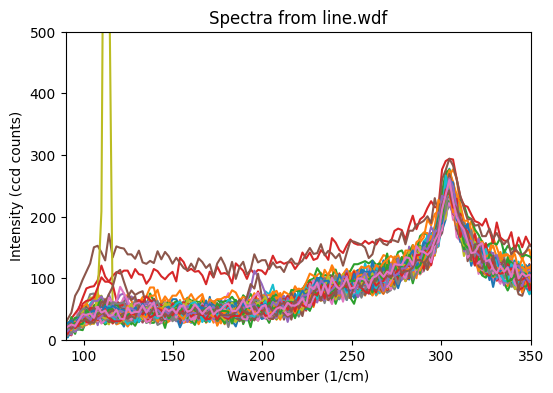

In [21]:
def main():
    url1 = r"F:\Postdoc Montpellier 2022\Data\Raman\Nam\20230823_F1048_FeCl_1_3\633/"
    url2 = r"F1048_633_lineMapping1.wdf"
    filename = url1 + url2
    reader = WDFReader(filename)

    # For mapping, xdata is still wavenumber
    wn = reader.xdata
    spectra = reader.spectra
    print(len(spectra))
    x = reader.xpos
    y = reader.ypos
    w, h = reader.map_shape
    print("The size of mapping is {0:d} * {1:d}".format(w, h))
    assert wn.shape[0] == spectra.shape[1]
    # Now spectra.shape becomes (i, j, spectrum)
    print(wn.shape, spectra.shape)
    if plot is True:        
        # Level the spectra with baseline intensity
        spectra = spectra - spectra.min(axis=1, keepdims=True)

        # Need to revert matrix for plotting
        spectra = spectra.T
        plt.figure(figsize=(6, 4))
        # plot the first 5 spectra
        for i in list_G:#range(spectra.shape[1])
            start = 660 # first point of spectra for fitting
            stop = 830 # last point of spectra for fitting
            plt.plot(wn[start:stop], spectra[:, i][start:stop], label="{0:d}".format(i))
        #plt.legend()
        plt.xlabel("Wavenumber (1/cm)")
        plt.ylabel("Intensity (ccd counts)")
        plt.title("Spectra from line.wdf")
        plt.ylim(0, 500)
        plt.xlim(90, 350)
        plt.show(block=False)
        plt.pause(3)
        plt.tight_layout()
        plt.close()        
    else:
        print("Wavenumber is like:", wn)
        print("Spectra matrix is like: \n", spectra)

    return

if __name__ == "__main__":
    main()

RBM fiting

201
The size of mapping is 201 * 1
(1015,) (201, 1015)
Current index i= 0
Current index i= 9
Current index i= 10
Current index i= 11
Current index i= 12
Current index i= 13
Current index i= 14
Current index i= 15
Current index i= 16
Current index i= 17
Current index i= 18
Current index i= 19
Current index i= 20
Current index i= 21
Current index i= 22
Current index i= 23
Current index i= 24
Current index i= 25
Current index i= 27
Current index i= 28
Current index i= 29
Current index i= 30
Current index i= 31
Current index i= 32
Current index i= 33
Current index i= 34
Current index i= 35
Current index i= 36
Current index i= 37
Current index i= 39
Current index i= 40
Current index i= 41
Current index i= 42
Current index i= 43
Current index i= 44
Current index i= 48
Current index i= 49
Current index i= 50
Current index i= 51
Current index i= 52
Current index i= 53
Current index i= 54
Current index i= 55
Current index i= 60
Current index i= 61
Current index i= 66
Current index i= 67
Current

,l1_amplitude,l1_center,l1_sigma,l1_fwhm,l1_height,l2_amplitude,l2_center,l2_sigma,l2_fwhm,l2_height,l3_amplitude,l3_center,l3_sigma,l3_fwhm,l3_height
0,10.000000,120.000000,15.115368,30.230735,0.210587,10.000010,200.000000,15.105341,30.210682,0.210727,10.000000,300.006475,15.113501,30.227003,0.210613
0,10.000000,126.587760,5.209331,10.418662,0.611038,10.000000,200.747457,3.000000,6.000000,1.061033,77.549852,299.341500,3.000000,6.000000,8.228295
0,10.000000,118.956837,3.000000,6.000000,1.061033,70.739618,215.684801,3.000000,6.000000,7.505707,263.905596,311.498751,5.699453,11.398907,14.738916
0,192.637229,110.367009,6.448015,12.896030,9.509646,79.109664,217.822351,3.000001,6.000002,8.393794,103.606983,306.361546,3.000000,6.000000,10.993043
0,1162.329304,125.614516,27.492012,54.984023,13.457761,375.172720,206.824708,7.356468,14.712935,16.233497,746.620710,297.506974,20.527390,41.054779,11.577544
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,83.449640,113.785725,3.000000,6.000000,8.854282,114.027225,216.033587,3.000000,6.000000,12.098665,7278.301782,272.797425,291.540684,583.081368,7.946594
0,366.560124,137.317367,13.462800,26.925601,8.666824,190.284637,214.948873,4.416276,8.832552,13.715059,911.428135,300.431959,27.627386,55.254771,10.501052
0,419.978868,128.700626,11.945249,23.890499,11.191347,490.328414,204.757914,17.662436,35.324873,8.836629,4413.591421,345.960257,121.268190,242.536380,11.584982
0,446.353125,126.922356,16.759776,33.519553,8.477358,150.501554,185.698970,3.000000,6.000000,15.968712,4053.407535,390.887110,125.550607,251.101213,10.276651


<Figure size 600x400 with 0 Axes>

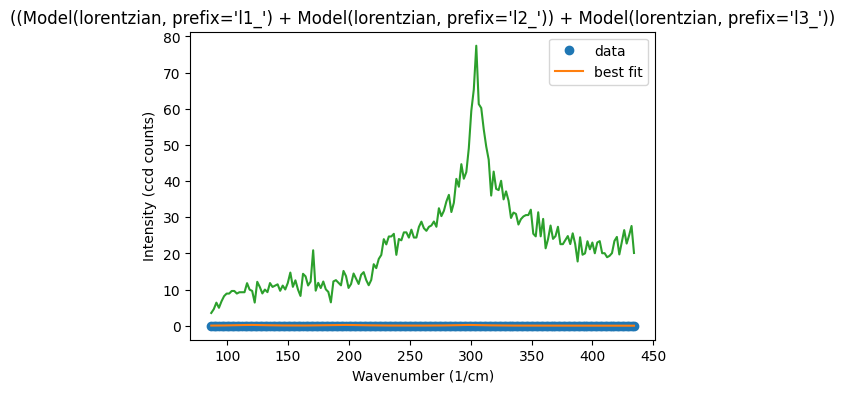

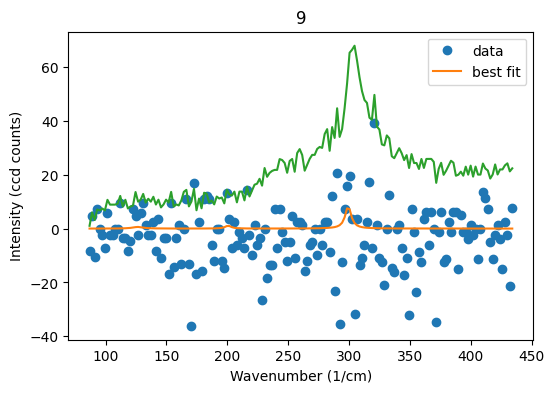

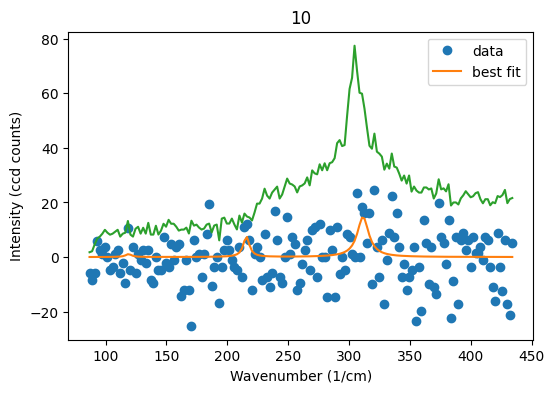

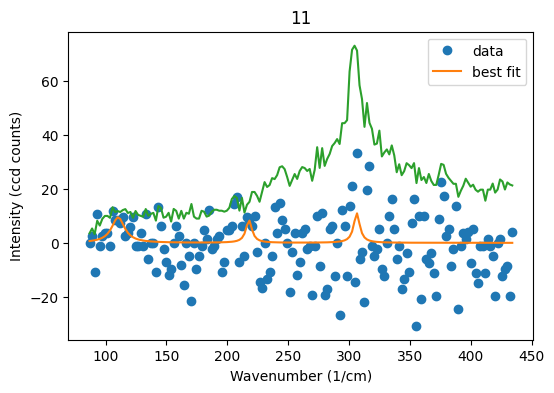

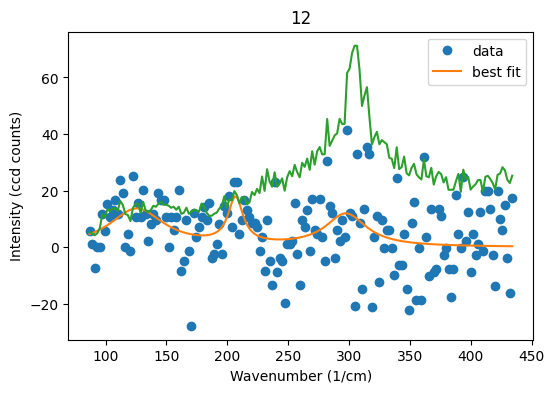

...

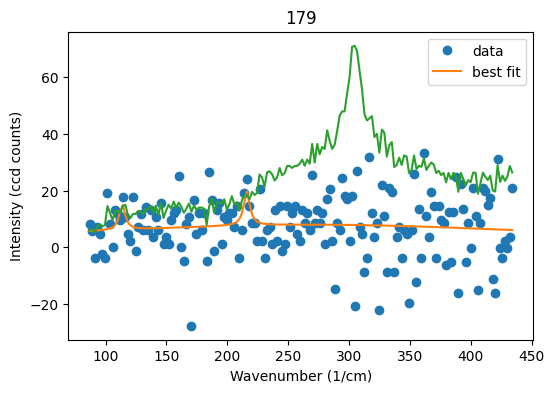

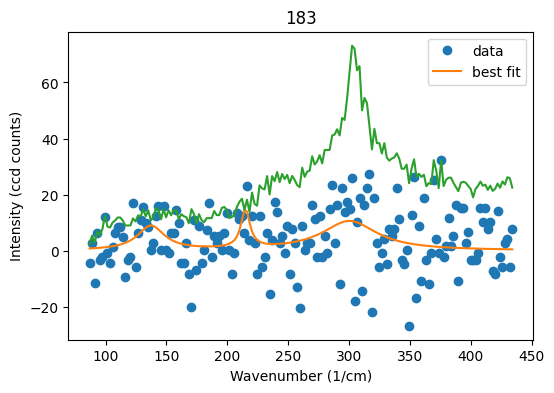

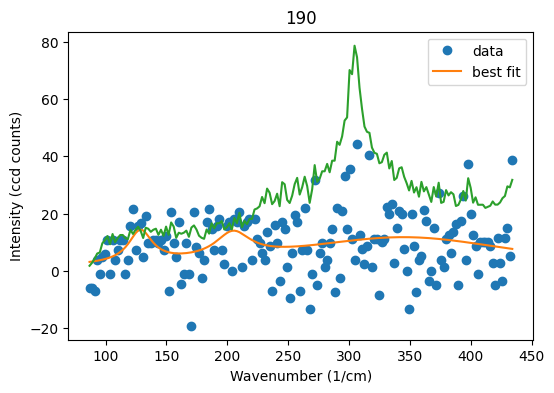

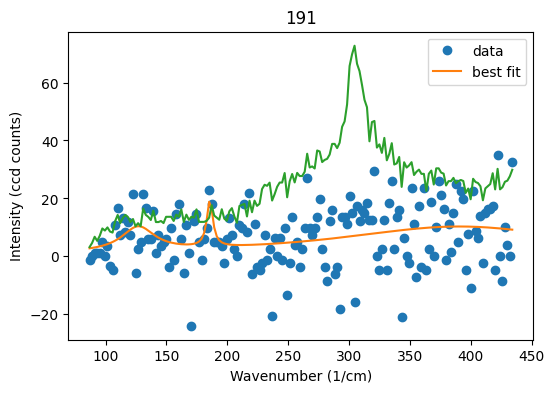

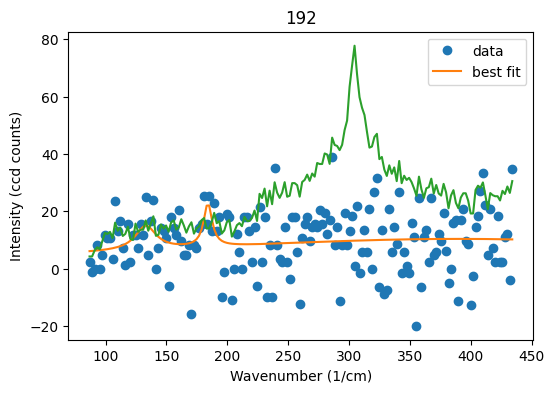

In [22]:
url1 = r"F:\Postdoc Montpellier 2022\Data\Raman\Nam\20230823_F1048_FeCl_1_3\633/"
url2 = r"F1048_633_lineMapping1.wdf"
filename = url1 + url2

reader = WDFReader(filename)

# For mapping, xdata is still wavenumber
wn = reader.xdata
spectra = reader.spectra
print(len(spectra))
x = reader.xpos
y = reader.ypos
w, h = reader.map_shape
df = pd.DataFrame([])
print("The size of mapping is {0:d} * {1:d}".format(w, h))
assert wn.shape[0] == spectra.shape[1]
# Now spectra.shape becomes (i, j, spectrum)
print(wn.shape, spectra.shape)

if plot is True:
    # Level the spectra with baseline intensity
    spectra = spectra - spectra.min(axis=1, keepdims=True)

    # Need to revert matrix for plotting
    spectra = spectra.T
    plt.figure(figsize=(6, 4))
    # plot the first 5 spectra
    for i in list_G: #spectra.shape[1]
        print("Current index i=",i) 
        start = 660 # first point of spectra for fitting
        stop = 830 # last point of spectra for fitting

        Lorentzian1 = LorentzianModel(prefix='l1_')
        pars = Lorentzian1.guess((spectra[:, i][start:stop]-spectra[:, 0][start:stop]), x=wn[:][start:stop])
        pars['l1_center'].set(120, min=90, max=150)
        pars['l1_sigma'].set(15, min=3)
        pars['l1_amplitude'].set(2000, min=10)
        
        Lorentzian2 = LorentzianModel(prefix='l2_')
        pars.update(Lorentzian2.make_params())
        pars['l2_center'].set(200, min=150, max=250)
        pars['l2_sigma'].set(15, min=3)
        pars['l2_amplitude'].set(2000, min=10)
        
        Lorentzian3 = LorentzianModel(prefix='l3_')
        pars.update(Lorentzian3.make_params())
        pars['l3_center'].set(300, min=250, max=400)
        pars['l3_sigma'].set(15, min=3)
        pars['l3_amplitude'].set(2000, min=10)
        
        mod = Lorentzian1 + Lorentzian2 + Lorentzian3
        
        init = mod.eval(pars, x=wn[:][start:stop])
        

        #pars = mod.guess((spectra[:, i][start:stop]-spectra[:, 0][start:stop]), x=wn[:][start:stop])
        out = mod.fit((spectra[:, i][start:stop]-spectra[:, 0][start:stop]), pars, x=wn[:][start:stop])
        plt.figure(figsize=(6, 4)) 
        out.plot_fit(title= i)
        plt.xlabel("Wavenumber (1/cm)")
        plt.ylabel("Intensity (ccd counts)")
        #plt.legend()
        #print(out.fit_report(min_correl=0.25))
        #print(out.params.valuesdict())
        
            
        plt.plot(wn[:][start:stop], 0.3*spectra[:, i][start:stop], label="{0:d}".format(i))
        
        data = pd.DataFrame([out.params.valuesdict()], columns=out.params.valuesdict().keys())
        df = df.append(data)
        
    #plt.show(block=False)
    #plt.pause(3)
    #plt.tight_layout()
    #plt.clf()
    
else:
    print("Wavenumber is like:", wn)
    print("Spectra matrix is like: \n", spectra)
display(df)

In [23]:
df.head()

,l1_amplitude,l1_center,l1_sigma,l1_fwhm,l1_height,l2_amplitude,l2_center,l2_sigma,l2_fwhm,l2_height,l3_amplitude,l3_center,l3_sigma,l3_fwhm,l3_height
0,10.000000,120.000000,15.115368,30.230735,0.210587,10.000010,200.000000,15.105341,30.210682,0.210727,10.000000,300.006475,15.113501,30.227003,0.210613
0,10.000000,126.587760,5.209331,10.418662,0.611038,10.000000,200.747457,3.000000,6.000000,1.061033,77.549852,299.341500,3.000000,6.000000,8.228295
0,10.000000,118.956837,3.000000,6.000000,1.061033,70.739618,215.684801,3.000000,6.000000,7.505707,263.905596,311.498751,5.699453,11.398907,14.738916
0,192.637229,110.367009,6.448015,12.896030,9.509646,79.109664,217.822351,3.000001,6.000002,8.393794,103.606983,306.361546,3.000000,6.000000,10.993043
0,1162.329304,125.614516,27.492012,54.984023,13.457761,375.172720,206.824708,7.356468,14.712935,16.233497,746.620710,297.506974,20.527390,41.054779,11.577544


In [24]:
df["Spectra_Number"] = list_G
df.head(5)

,l1_amplitude,l1_center,l1_sigma,l1_fwhm,l1_height,l2_amplitude,l2_center,l2_sigma,l2_fwhm,l2_height,l3_amplitude,l3_center,l3_sigma,l3_fwhm,l3_height,Spectra_Number
0,10.000000,120.000000,15.115368,30.230735,0.210587,10.000010,200.000000,15.105341,30.210682,0.210727,10.000000,300.006475,15.113501,30.227003,0.210613,0
0,10.000000,126.587760,5.209331,10.418662,0.611038,10.000000,200.747457,3.000000,6.000000,1.061033,77.549852,299.341500,3.000000,6.000000,8.228295,9
0,10.000000,118.956837,3.000000,6.000000,1.061033,70.739618,215.684801,3.000000,6.000000,7.505707,263.905596,311.498751,5.699453,11.398907,14.738916,10
0,192.637229,110.367009,6.448015,12.896030,9.509646,79.109664,217.822351,3.000001,6.000002,8.393794,103.606983,306.361546,3.000000,6.000000,10.993043,11
0,1162.329304,125.614516,27.492012,54.984023,13.457761,375.172720,206.824708,7.356468,14.712935,16.233497,746.620710,297.506974,20.527390,41.054779,11.577544,12


In [25]:
df = df.reset_index()
df = df.drop('index', axis=1)
df.head()

,l1_amplitude,l1_center,l1_sigma,l1_fwhm,l1_height,l2_amplitude,l2_center,l2_sigma,l2_fwhm,l2_height,l3_amplitude,l3_center,l3_sigma,l3_fwhm,l3_height,Spectra_Number
0,10.000000,120.000000,15.115368,30.230735,0.210587,10.000010,200.000000,15.105341,30.210682,0.210727,10.000000,300.006475,15.113501,30.227003,0.210613,0
1,10.000000,126.587760,5.209331,10.418662,0.611038,10.000000,200.747457,3.000000,6.000000,1.061033,77.549852,299.341500,3.000000,6.000000,8.228295,9
2,10.000000,118.956837,3.000000,6.000000,1.061033,70.739618,215.684801,3.000000,6.000000,7.505707,263.905596,311.498751,5.699453,11.398907,14.738916,10
3,192.637229,110.367009,6.448015,12.896030,9.509646,79.109664,217.822351,3.000001,6.000002,8.393794,103.606983,306.361546,3.000000,6.000000,10.993043,11
4,1162.329304,125.614516,27.492012,54.984023,13.457761,375.172720,206.824708,7.356468,14.712935,16.233497,746.620710,297.506974,20.527390,41.054779,11.577544,12


In [26]:
df_height = pd.concat([df["l1_height"], df["l2_height"], df["l3_height"]])
df_center = pd.concat([df["l1_center"], df["l2_center"], df["l3_center"]])
df_fwhm = pd.concat([df["l1_fwhm"], df["l2_fwhm"], df["l3_fwhm"]])

df_concat = pd.concat([df_height, df_center, df_fwhm], axis=1)
df_concat.columns = ['height', 'RBM', 'fwhm']
df_concat["Spectra_Number"] = df["Spectra_Number"]

df_clean_RBM = df_concat
df_clean_RBM.tail(200)

,height,RBM,fwhm,Spectra_Number
74,54.307790,197.168541,15.194346,98
75,38.223853,195.800050,18.268708,99
76,21.736130,197.326266,15.421427,100
77,16.445988,197.973183,9.469766,101
78,27.147597,200.600418,6.000106,102
...,...,...,...,...
132,7.946594,272.797425,583.081368,179
133,10.501052,300.431959,55.254771,183
134,11.584982,345.960257,242.536380,190
135,10.276651,390.887110,251.101213,191


In [27]:
df_clean_RBM.describe()

,height,RBM,fwhm,Spectra_Number
count,411.000000,411.000000,411.000000,411.000000
mean,14.456769,223.215583,171.714639,92.072993
std,38.414230,98.244705,716.694656,52.324219
min,0.001784,95.094719,6.000000,0.000000
25%,7.056981,128.484736,6.123840,44.000000
50%,10.531365,197.217246,30.691626,92.000000
75%,14.508878,300.416193,109.375888,138.000000
max,761.316710,400.000000,10017.211818,192.000000


In [28]:
df_clean_RBM = df_clean_RBM.loc[((df_clean_RBM["height"] > 30) & (df_clean_RBM["height"] < 10000))]
df_clean_RBM = df_clean_RBM.loc[(df_clean_RBM["RBM"] > 90) & (df_clean_RBM["RBM"] < 400)]
df_clean_RBM = df_clean_RBM.loc[(df_clean_RBM["fwhm"] > 3) & (df_clean_RBM["fwhm"] < 80)]
df_clean_RBM["diameter(nm)"] = 218.5/(df_clean_RBM["RBM"]-15.9)
df_clean_RBM.head(5)

,height,RBM,fwhm,Spectra_Number,diameter(nm)
7,37.750538,105.700084,8.758008,15,2.433183
8,39.640857,106.749794,9.723983,16,2.405069
31,33.747816,136.459087,12.253797,41,1.812389
43,39.314704,123.272192,31.224649,60,2.034978
45,78.694320,118.236407,32.117774,66,2.135115


In [29]:
df_clean_RBM.describe()

,height,RBM,fwhm,Spectra_Number,diameter(nm)
count,17.000000,17.000000,17.000000,17.000000,17.000000
mean,87.833824,143.314518,14.765239,96.764706,1.892141
std,174.094616,50.707963,7.966062,48.780797,0.493980
min,32.242904,105.700084,6.000000,15.000000,0.783022
25%,38.223853,112.522765,9.723983,60.000000,1.812389
50%,39.516042,121.501993,12.976726,99.000000,2.069090
75%,54.307790,136.459087,18.268708,140.000000,2.261372
max,761.316710,294.947035,32.117774,167.000000,2.433183


In [30]:
df_clean_RBM.to_csv(r"F:\Postdoc Montpellier 2022\Data\Raman\Nam\20230823_F1048_FeCl_1_3\633\fit_res_633_RBM.csv")
url = r"F:\Postdoc Montpellier 2022\Data\Raman\Nam\20230823_F1048_FeCl_1_3\633/fit_res_633_RBM.csv"
df_633_RBM = pd.read_csv(url, encoding='ISO-8859-1', delimiter=',').drop('Unnamed: 0', axis = 'columns')
df_633_RBM.head(2)

,height,RBM,fwhm,Spectra_Number,diameter(nm)
0,37.750538,105.700084,8.758008,15,2.433183
1,39.640857,106.749794,9.723983,16,2.405069


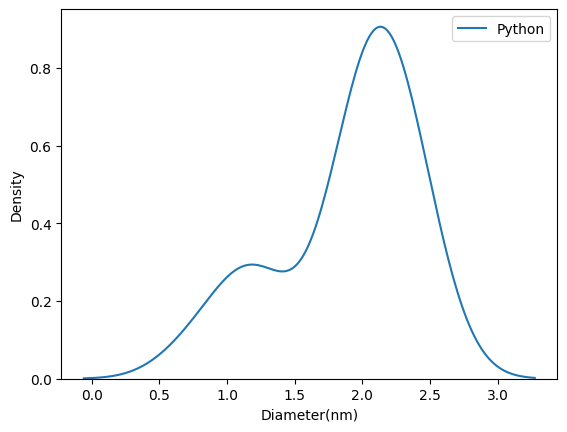

In [31]:
sns.kdeplot(data=df_633_RBM, x="diameter(nm)", label='Python')
#sns.kdeplot(data=df1, x="Diameter (nm)", label='Said manual')
plt.xlabel("Diameter(nm)")
plt.legend()
plt.show()